# Trabajo práctico 2

## Parte 1: Analizando la base

1. Utilizando información disponible en la página del INDEC, expliquen brevemente cómo se identifica a las personas pobres.

Se identifica como persona pobre a aquella que forma parte de un hogar que no tiene la capacidad de satisfacer –por medio de la compra de bienes y servicios– un conjunto de necesidades alimentarias y no alimentarias consideradas esenciales. 

Metodológicamente, primero se calcula una línea de pobreza y luego se contrasta contra ella el ingreso familiar total. Si este último es menor que la línea de pobreza, determinada por la Canasta Básica Total (CBT), entonces todos los integrantes del hogar son identificados como pobres. La CBT se obtiene a partir del cálculo de la Canasta Básica Alimentaria (CBA). El procedimiento para obtener la CBA toma en cuenta los requerimientos normativos kilocalóricos y proteicos del hogar. Dado que los requerimientos son diferentes según la edad, el sexo y otras características, es necesario tomar una unidad de referencia común para poder reflejar estas características. La unidad que se toma es el varón adulto de entre 30 y 60 años. Luego, se compara las características de todas las personas con las de un varón adulto entre las edades mencionadas.

Así, se suman los requerimientos calóricos de todos los integrantes del hogar y se establece la CBA para cada hogar. Para obtener la CBT se multiplica la CBA por un coeficiente que relaciona el gasto en alimento y el gasto total de las familias. Finalmente, este CBT es el que se compara con los ingresos totales por hogar.

2. Entren a la página https://www.indec.gob.ar/ y vayan a la sección Servicios y Herramientas > Bases de datos. Descarguen la base de microdatos de la Encuesta Permanente de Hogares (EPH) correspondiente al primer trimestre de 2023 en formato xls (una vez descargada, la base a usar debería llamarse usu_individual_T123.xls). En la página web, también encontrará un diccionario de variables con el nombre de "Diseño de registro y estructura para las bases preliminares (hogares y personas)”; este archivo les indica qué significa cada variable que aparece en la base de datos, en particular, en la sección de Diseño de registros de la base Personas.

(a) Eliminen todas las observaciones que no corresponden a los aglomerados de Ciudad Autónoma de Buenos Aires o Gran Buenos Aires.

In [1011]:
import pandas as pd

# Importamos la base de datos.

df_original = pd.read_excel(r'C:\Users\julia\Documents\UdeSA 2023\Semestre de primavera\Big Data\Trabajos prácticos\TP 2\EPH_usu_1er_Trim_2023_xlsx\usu_individual_T123.xlsx')

# Importamos todos los paquetes que vamos a utilizar a lo largo del Trabajo.

from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
import numpy as np
from sklearn import datasets
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score 
from sklearn.metrics import roc_curve, roc_auc_score, RocCurveDisplay
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier

In [1012]:
# Nos quedamos con los datos correspondientes a los aglomerados de Ciudad Autónoma de Buenos Aires y Gran Buenos Aires.

df = df_original[(df_original['AGLOMERADO'] == 32) | (df_original['AGLOMERADO'] == 33)]

(b) Si hay observaciones con valores que no tienen sentido, descártenlas (ingresos y edades negativos, por ejemplo).

Luego de haber estudiado la base de datos, consideramos como valores erróneos o sin sentido a aquellos que pertenecen a variables de ingresos y edades, y son negativos. Además, notamos que algunas fechas de nacimiento no son las correctas dadas las edades reportadas. En estos casos decidimos proceder eliminando las observaciones con estas fechas de nacimiento erróneas. Estas observaciones fueron simples de identificar debido a que cuando la fecha de nacimiento era errónea, siempre se reportaba la misma fecha: 1/1/1900.

En primer lugar, para eliminar todas las observaciones con valores negativos generamos la variable types para observar qué formatos tenían las variables de la base de datos [Primer paso].

Luego de observar los 4 formatos que tenemos y la lista de variables con estos formatos, procedimos a borrar las observaciones con valores negativos de las variables numéricas (con formato float64 e int64). Para esto corrimos un loop en que solo mantenemos la observación si los valores de todas las variables numéricas son positivos o missing (es importante notar que puede haber missing y no ser un valor "sin sentido") [Segundo paso].

Por último, eliminamos las observaciones si la fecha de nacimiento reportada era 1/1/1900 [Tercer paso].

In [1013]:
# Primer paso:

types = []

for columna in df.columns:
    if df[columna].dtypes not in types:
        types.append(df[columna].dtypes)
        
print('Formatos de las variables:', types)

nums = ['float64','int64']
listado = []

for columna in df.columns:
    if df[columna].dtypes in nums:
        listado.append(columna)

print('Listado de variables que corregiremos:', listado)

# Segundo paso:

print('\nShape de la base de CABA y GBA: ', df.shape)

for i in listado:
    df = df[((df[[i]] >= 0) | (df[[i]].isna())).all(1)]
    
print('\nShape de la base: ', df.shape)

# Tercer paso:

date = datetime(1900, 1, 1)
df = df[df['CH05']!=date]

df.index = range(len(df))

print('\nShape de la base corregida de CABA y GBA: ', df.shape)

df

Formatos de las variables: [dtype('O'), dtype('int64'), dtype('float64')]
Listado de variables que corregiremos: ['ANO4', 'TRIMESTRE', 'NRO_HOGAR', 'COMPONENTE', 'H15', 'REGION', 'AGLOMERADO', 'PONDERA', 'CH03', 'CH04', 'CH06', 'CH07', 'CH08', 'CH09', 'CH10', 'CH11', 'CH12', 'CH13', 'CH14', 'CH15', 'CH15_COD', 'CH16', 'CH16_COD', 'NIVEL_ED', 'ESTADO', 'CAT_OCUP', 'CAT_INAC', 'IMPUTA', 'PP02C1', 'PP02C2', 'PP02C3', 'PP02C4', 'PP02C5', 'PP02C6', 'PP02C7', 'PP02C8', 'PP02E', 'PP02H', 'PP02I', 'PP03C', 'PP03D', 'PP3E_TOT', 'PP3F_TOT', 'PP03G', 'PP03H', 'PP03I', 'PP03J', 'INTENSI', 'PP04A', 'PP04B_COD', 'PP04B1', 'PP04B2', 'PP04B3_MES', 'PP04B3_ANO', 'PP04B3_DIA', 'PP04C', 'PP04C99', 'PP04D_COD', 'PP04G', 'PP05B2_MES', 'PP05B2_ANO', 'PP05B2_DIA', 'PP05C_1', 'PP05C_2', 'PP05C_3', 'PP05E', 'PP05F', 'PP05H', 'PP06A', 'PP06C', 'PP06D', 'PP06E', 'PP06H', 'PP07A', 'PP07C', 'PP07D', 'PP07E', 'PP07F1', 'PP07F2', 'PP07F3', 'PP07F4', 'PP07F5', 'PP07G1', 'PP07G2', 'PP07G3', 'PP07G4', 'PP07G_59', 'PP07

,CODUSU,ANO4,TRIMESTRE,NRO_HOGAR,COMPONENTE,H15,REGION,MAS_500,AGLOMERADO,PONDERA,...,PDECIFR,ADECIFR,IPCF,DECCFR,IDECCFR,RDECCFR,GDECCFR,PDECCFR,ADECCFR,PONDIH
0,TQRMNORUYHLMSMCDEIJAH00719364,2023,1,1,1,1,1,S,33,1545,...,NaN,4,67500.00,5,NaN,5,5.0,NaN,6,2540
1,TQRMNORUYHLMSMCDEIJAH00719364,2023,1,1,2,1,1,S,33,1545,...,NaN,4,67500.00,5,NaN,5,5.0,NaN,6,2540
2,TQRMNOSRQHJNSOCDEIJAH00802640,2023,1,1,1,1,1,S,33,8423,...,NaN,2,23333.33,1,NaN,1,1.0,NaN,1,14082
3,TQRMNOSRQHJNSOCDEIJAH00802640,2023,1,1,2,1,1,S,33,8423,...,NaN,2,23333.33,1,NaN,1,1.0,NaN,1,14082
4,TQRMNOSRQHJNSOCDEIJAH00802640,2023,1,1,3,0,1,S,33,8423,...,NaN,2,23333.33,1,NaN,1,1.0,NaN,1,14082
5,TQRMNOPYVHLMRLCDEIJAH00719346,2023,1,1,3,1,1,S,33,2086,...,NaN,12,0.00,12,NaN,12,12.0,NaN,12,0
6,TQRMNOTTTHKNLSCDEIIAD00780051,2023,1,1,1,1,1,S,32,1798,...,NaN,7,320000.00,10,NaN,10,10.0,NaN,10,1511
7,TQRMNOSRXHKMLUCDEIIAD00780093,2023,1,1,3,1,1,S,32,2361,...,NaN,12,0.00,12,NaN,12,12.0,NaN,12,0
8,TQRMNOSRXHKMLUCDEIIAD00780093,2023,1,1,4,0,1,S,32,2361,...,NaN,12,0.00,12,NaN,12,12.0,NaN,12,0
9,TQRMNOQTWHMKMPCDEIIAD00801881,2023,1,1,1,1,1,S,32,780,...,NaN,5,103250.00,8,NaN,7,7.0,NaN,5,1205


(c) Una vez hecha esa limpieza, realicen un gráfico de barras mostrando la
composición por sexo.

Cantidad de hombres en la muestra: 2538.
Cantidad de mujeres en la muestra: 2864.


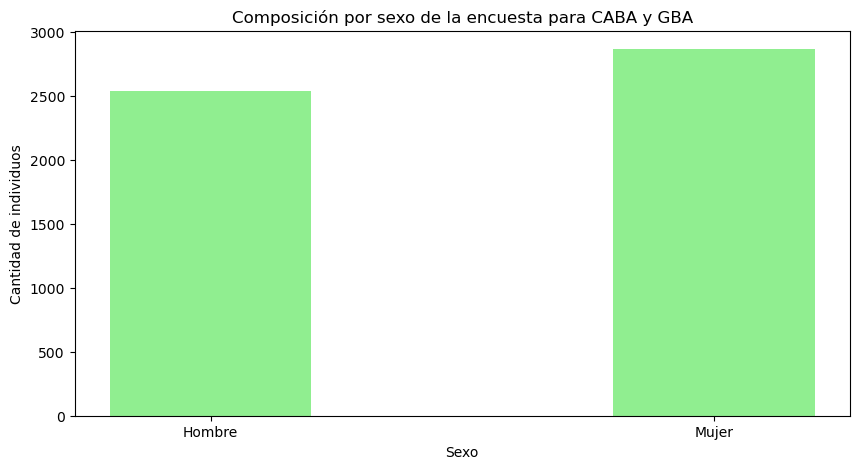

In [1014]:
male = (df['CH04'] == 1).sum()
female = (df['CH04'] == 2).sum()

print('Cantidad de hombres en la muestra: ' + str(male) + '.')
print('Cantidad de mujeres en la muestra: ' + str(female) + '.')
    
data = {'Hombre': male, 'Mujer': female}

gender = list(data.keys())
values = list(data.values())

fig = plt.figure(figsize = (10, 5))
 
# creating the bar plot
plt.bar(gender, values, color ='lightgreen', 
        width = 0.4)
 
plt.xlabel("Sexo")
plt.ylabel("Cantidad de individuos")
plt.title("Composición por sexo de la encuesta para CABA y GBA")
plt.show()

(d) Realicen una matriz de correlación con las siguientes variables: CH04,
CH07, CH08, NIVEL ED, ESTADO, CAT INAC, IPCF. Comenten los resultados.

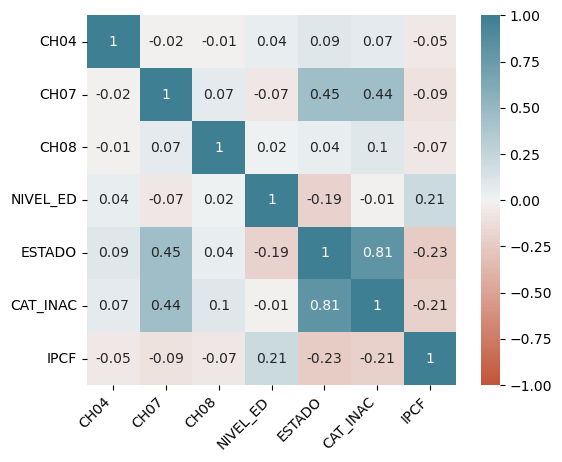

In [1015]:
corr = df[['CH04', 'CH07', 'CH08', 'NIVEL_ED', 'ESTADO', 'CAT_INAC', 'IPCF']].corr()
corr = corr.round(2)
ax = sns.heatmap(    corr, 
    vmin=-1, vmax=1, center=0, annot=True,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

Luego de correr la matriz de correlaciones entre las variables especificadas, es posible observar una alta correlación positiva (0.81) entre "ESTADO" y "CAT_INAC". Ambas son variables categóricas. Sin embargo, no es posible afirmar mucho más sobre esta correlación debido a que los valores que toma la variable "CAT_INAC" no siguen un orden particular. Es decir, si observáramos una correlación positiva entre nivel educativo y nivel de ingresos, sí podríamos decir algo si el nivel educativo sigue un orden ascendente (el nivel educativo alcanzado es mayor cuanto mayor es el valor que se le asigna en la variable categórica). No obstante, esto no ocurre en este caso. "CAT_INAC" no sigue un orden particular.

Existe una correlación positiva (0.45) también entre la variable "ESTADO" y "CH07" (estado civil). Aquí sí se podría dar alguna intuición debido a que ambas variables categóricas siguen un orden. En "CH07" los valores más chicos (1 y 2) reflejan el estado civil unido y casado, mientras que los más altos (3, 4 y 5) son asignados a las personas separadas/divorciadas, viudas y solteras. En "ESTADO" el valor de 1 indica el estado laboral ocupado, mientras que valores más altos (2, 3 y 4) reflejan los estados desocupado, inactivo y menor de 10 años. Por lo tanto, esta correlación positiva podría estar diciéndonos algo sobre la relación entre la ocupación y el estado civil de las personas.

Por último, otra de las correlaciones notorias que vemos (0.44) es entre "CAT_INAC" y "CH07". Sin embargo, tal como señalamos previamentes, "CAT_INAC" no sigue un orden particular, por lo que no nos parece claro que esta correlación pueda estar indicándonos algo.

(e) ¿Cuántos desocupados hay en la muestra? ¿Cuántos inactivos? ¿Cuál es
la media de ingreso per cápita familiar (IPCF) según estado (ocupado,
desocupado, inactivo)?

In [1016]:
print(f"Hay {len(df[df['ESTADO'] == 2])} desocupados en la muestra.")
print(f"Hay {len(df[df['ESTADO'] == 3])} inactivos en la muestra.")

print('\nMedia del ingreso per cápita familiar (IPCF): %.2f' %np.mean(df['IPCF']))
print('Media del ingreso per cápita familiar (IPCF) de ocupados: %.2f' %np.mean(df[df['ESTADO'] == 1]['IPCF']))
print('Media del ingreso per cápita familiar (IPCF) de desocupados: %.2f' %np.mean(df[df['ESTADO'] == 2]['IPCF']))
print('Media del ingreso per cápita familiar (IPCF) de inactivos: %.2f' %np.mean(df[df['ESTADO'] == 3]['IPCF']))

Hay 235 desocupados en la muestra
Hay 2264 inactivos en la muestra

Media del ingreso per cápita familiar (IPCF): 63672.60
Media del ingreso per cápita familiar (IPCF) de ocupados: 95591.90
Media del ingreso per cápita familiar (IPCF) de desocupados: 28336.22
Media del ingreso per cápita familiar (IPCF) de inactivos: 47349.46


(f) Utilizando el archivo tabla_adulto_equiv.xlsx, agreguen a su base de
datos una columna llamada adulto_equiv que contenga los valores de
adulto equivalente de cada persona según su sexo y edad (por ejemplo,
a un varón de 2 años le corresponde 0.46). Finalmente, con el comando
groupby sumen esta nueva columna para las personas que pertenecen a un
mismo hogar y guarden ese dato en una columna llamada ad_equiv_hogar.

Generamos dos listas con los valores de adulto equivalente de cada personas según su sexo y edad.

In [1017]:
valores_m = [.35,.37,.46,.51,.55,.6,.64,.66,.68,.69,.7,.72,.74,.76,.76,.77,.77,.77,.76,.77,.76,.67,.63]
valores_h = [.35,.37,.46,.51,.55,.6,.64,.66,.68,.69,.79,.82,.85,.9,.96,1,1.03,1.04,1.02,1,1,.83,.74]
df['adulto_equiv'] = 0

A través de un loop y una serie de condicionales imputamos los valores de adulto equivalente para todos los individuos del Data Frame.

In [1018]:
modified_rows = []

for j in range(0, 5402, 1):
    row = df.iloc[j].copy()
    if row['CH04'] == 1:
        for i in range(0, 18):
            if row['CH06'] == i:
                row['adulto_equiv'] = valores_m[i]
        if row['CH06'] in range(18,30):
            row['adulto_equiv'] = valores_m[18]
        elif row['CH06'] in range(30,46):
            row['adulto_equiv'] = valores_m[19]
        elif row['CH06'] in range(46,61):
            row['adulto_equiv'] = valores_m[20]
        elif row['CH06'] in range(61,76):
            row['adulto_equiv'] = valores_m[21]
        elif row['CH06'] in range(76,99):
            row['adulto_equiv'] = valores_m[22]
    
    else:
        for i in range(0,18,1):
            if row['CH06'] == i:
                row['adulto_equiv'] = valores_h[i]
        if row['CH06'] in range(18,30):
            row['adulto_equiv'] = valores_h[18]
        elif row['CH06'] in range(30,46):
            row['adulto_equiv'] = valores_h[19]
        elif row['CH06'] in range(46,61):
            row['adulto_equiv'] = valores_h[20]
        elif row['CH06'] in range(61,76):
            row['adulto_equiv'] = valores_h[21]
        elif row['CH06'] in range(76,100):
            row['adulto_equiv'] = valores_h[22]
    modified_rows.append(row)

df = pd.DataFrame(modified_rows)
df

,CODUSU,ANO4,TRIMESTRE,NRO_HOGAR,COMPONENTE,H15,REGION,MAS_500,AGLOMERADO,PONDERA,...,ADECIFR,IPCF,DECCFR,IDECCFR,RDECCFR,GDECCFR,PDECCFR,ADECCFR,PONDIH,adulto_equiv
0,TQRMNORUYHLMSMCDEIJAH00719364,2023,1,1,1,1,1,S,33,1545,...,4,67500.00,5,NaN,5,5.0,NaN,6,2540,0.83
1,TQRMNORUYHLMSMCDEIJAH00719364,2023,1,1,2,1,1,S,33,1545,...,4,67500.00,5,NaN,5,5.0,NaN,6,2540,0.67
2,TQRMNOSRQHJNSOCDEIJAH00802640,2023,1,1,1,1,1,S,33,8423,...,2,23333.33,1,NaN,1,1.0,NaN,1,14082,0.77
3,TQRMNOSRQHJNSOCDEIJAH00802640,2023,1,1,2,1,1,S,33,8423,...,2,23333.33,1,NaN,1,1.0,NaN,1,14082,1.02
4,TQRMNOSRQHJNSOCDEIJAH00802640,2023,1,1,3,0,1,S,33,8423,...,2,23333.33,1,NaN,1,1.0,NaN,1,14082,0.69
5,TQRMNOPYVHLMRLCDEIJAH00719346,2023,1,1,3,1,1,S,33,2086,...,12,0.00,12,NaN,12,12.0,NaN,12,0,0.76
6,TQRMNOTTTHKNLSCDEIIAD00780051,2023,1,1,1,1,1,S,32,1798,...,7,320000.00,10,NaN,10,10.0,NaN,10,1511,0.77
7,TQRMNOSRXHKMLUCDEIIAD00780093,2023,1,1,3,1,1,S,32,2361,...,12,0.00,12,NaN,12,12.0,NaN,12,0,0.79
8,TQRMNOSRXHKMLUCDEIIAD00780093,2023,1,1,4,0,1,S,32,2361,...,12,0.00,12,NaN,12,12.0,NaN,12,0,0.51
9,TQRMNOQTWHMKMPCDEIIAD00801881,2023,1,1,1,1,1,S,32,780,...,5,103250.00,8,NaN,7,7.0,NaN,5,1205,0.83


Si nada es impreso en el cuadro de siguiente código, entonces todas las observaciones tienen una equivalencia de necesidades energéticas (adultos equivalentes).

In [1019]:
for j in range(0, 5402, 1):
    if df.iloc[j]['adulto_equiv'] == 0:
        print('Existe un error en la fila ' + str(j) + ' de la nueva variable adultoequiv.')

Agrupamos las unidades de equivalencia por hogar.

In [1020]:
df['ad_equiv_hogar'] = df.groupby('CODUSU')['adulto_equiv'].transform('sum')
df

,CODUSU,ANO4,TRIMESTRE,NRO_HOGAR,COMPONENTE,H15,REGION,MAS_500,AGLOMERADO,PONDERA,...,IPCF,DECCFR,IDECCFR,RDECCFR,GDECCFR,PDECCFR,ADECCFR,PONDIH,adulto_equiv,ad_equiv_hogar
0,TQRMNORUYHLMSMCDEIJAH00719364,2023,1,1,1,1,1,S,33,1545,...,67500.00,5,NaN,5,5.0,NaN,6,2540,0.83,1.50
1,TQRMNORUYHLMSMCDEIJAH00719364,2023,1,1,2,1,1,S,33,1545,...,67500.00,5,NaN,5,5.0,NaN,6,2540,0.67,1.50
2,TQRMNOSRQHJNSOCDEIJAH00802640,2023,1,1,1,1,1,S,33,8423,...,23333.33,1,NaN,1,1.0,NaN,1,14082,0.77,2.48
3,TQRMNOSRQHJNSOCDEIJAH00802640,2023,1,1,2,1,1,S,33,8423,...,23333.33,1,NaN,1,1.0,NaN,1,14082,1.02,2.48
4,TQRMNOSRQHJNSOCDEIJAH00802640,2023,1,1,3,0,1,S,33,8423,...,23333.33,1,NaN,1,1.0,NaN,1,14082,0.69,2.48
5,TQRMNOPYVHLMRLCDEIJAH00719346,2023,1,1,3,1,1,S,33,2086,...,0.00,12,NaN,12,12.0,NaN,12,0,0.76,0.76
6,TQRMNOTTTHKNLSCDEIIAD00780051,2023,1,1,1,1,1,S,32,1798,...,320000.00,10,NaN,10,10.0,NaN,10,1511,0.77,0.77
7,TQRMNOSRXHKMLUCDEIIAD00780093,2023,1,1,3,1,1,S,32,2361,...,0.00,12,NaN,12,12.0,NaN,12,0,0.79,1.30
8,TQRMNOSRXHKMLUCDEIIAD00780093,2023,1,1,4,0,1,S,32,2361,...,0.00,12,NaN,12,12.0,NaN,12,0,0.51,1.30
9,TQRMNOQTWHMKMPCDEIIAD00801881,2023,1,1,1,1,1,S,32,780,...,103250.00,8,NaN,7,7.0,NaN,5,1205,0.83,1.50


3. Uno de los grandes problemas de la EPH es la creciente cantidad de hogares
que no reportan sus ingresos (ver por ejemplo el siguiente informe). ¿Cuántas
personas no respondieron cuál es su ingreso total familiar (ITF)? Guarden como
una base distinta llamada respondieron las observaciones donde respondieron
la pregunta sobre su ITF. Las observaciones con ITF = 0 guárdenlas en una
base bajo el nombre norespondieron.

In [1021]:
respondieron = df[df['ITF'] != 0].copy()
norespondieron = df[df['ITF'] == 0].copy()

print(df.shape)
print(respondieron.shape)
print(norespondieron.shape)
print('\n%.0f personas no respondieron cuál es su ingreso familiar total (ITF).' %len(norespondieron))

(5402, 179)
(3896, 179)
(1506, 179)

1506 personas no respondieron cuál es su ingreso familiar total (ITF).


4. Sabiendo que la Canasta Básica Total para un adulto equivalente en el Gran
Buenos Aires en el primer trimestre de 2023 es aproximadamente $57.371, 05,
agreguen a la base respondieron una columna llamada ingreso_necesario
que sea el producto de este valor por ad_equiv_hogar. Note que este es el valor
mínimo que necesita ese hogar para no ser pobre.

In [1022]:
respondieron['ingreso_necesario'] = respondieron['ad_equiv_hogar']*57371.05

5. Por último, agreguen a respondieron una columna llamada pobre que tome
valor 1 si el ITF es menor al ingreso necesario que necesita esa familia, y 0
en caso contrario. ¿Cuántos pobres identificaron?

In [1042]:
respondieron['pobre'] = (respondieron['ITF'] < respondieron['ingreso_necesario']).astype(int)

print("Identificamos %.0f pobres." %np.sum(respondieron['pobre']))
print("Esto equivale a un %.2f por ciento de pobres de la base respondieron." %((np.sum(respondieron['pobre']/len(respondieron)))*100))

Identificamos 1398 pobres.
Esto equivale a un 35.88 por ciento de pobres de la base respondieron.


## Parte 2: Clasificación

El objetivo de esta parte del trabajo es intentar predecir si una persona es o no pobre
utilizando datos distintos al ingreso, dado que muchos hogares son reacios a responder
cuánto ganan.

1. Eliminen de ambas bases todas las variables relacionadas a ingresos (en el
archivo codigos eph.pdf ver las categorías: ingresos de la ocupación principal de los asalariados, ingresos de la ocupación principal, ingresos de otras
ocupaciones, ingreso total individual, ingresos no laborales, ingreso total familiar, ingreso per cápita familiar). Elimine también las columnas adulto_equiv,
ad_equiv_hogar e ingreso_necesario.

In [1024]:
respondieron.drop(['PP06C','PP06D','PP08D1','PP08D4','PP08F1','PP08F2','PP08J1','PP08J2','PP08J3','P21','TOT_P12','P47T','V2_M','V3_M','V4_M','V5_M','V8_M','V9_M','V10_M','V11_M','V12_M','V18_M','V19_AM','V21_M','T_VI','ITF','IPCF','adulto_equiv','ad_equiv_hogar','ingreso_necesario'], axis=1, inplace = True)

norespondieron.drop(['PP06C','PP06D','PP08D1','PP08D4','PP08F1','PP08F2','PP08J1','PP08J2','PP08J3','P21','TOT_P12','P47T','V2_M','V3_M','V4_M','V5_M','V8_M','V9_M','V10_M','V11_M','V12_M','V18_M','V19_AM','V21_M','T_VI','ITF','IPCF','adulto_equiv','ad_equiv_hogar'], axis=1, inplace = True)

2. Partan la base respondieron en una base de prueba (test) y una de entrenamiento (train) utilizando el comando train_test_split. La base de entrenamiento debe comprender el 70% de los datos, y la semilla a utilizar (random
state instance) debe ser 201. Establezca a pobre como su variable dependiente en la base de entrenamiento (vector y). El resto de las variables serán las
variables independientes (matriz X). Recuerden agregar la columna de unos (1).

En pos de elegir las variables que utilizaremos para predecir si una familia es pobre, lo primero que hicimos fue contar la cantidad de missing values de las posibles variables explicativas. Nuestro objetivo es utilizar como X variables con pocos o sin missing values, sino no podremos calibrar el modelo correctamente.

In [1025]:
missing_values = respondieron.isna().sum()
missing_values_sorted = missing_values.sort_values(ascending=False)
pd.set_option('display.max_rows', None)

print(missing_values_sorted)

PDECOCUR      3896
PP09C_ESP     3896
PDECCFR       3896
IDECINDR      3896
IDECCFR       3896
IDECOCUR      3896
PDECIFR       3896
PDECINDR      3896
IDECIFR       3896
PP09A_ESP     3885
IMPUTA        3883
CH16_COD      3828
PP11D_COD     3804
PP11R         3758
PP11S         3758
PP11G_MES     3758
PP11Q         3758
PP11O         3758
PP11N         3758
PP11M         3758
PP11L1        3758
PP11G_DIA     3758
PP11L         3758
PP11P         3758
PP11T         3758
PP11B2_MES    3758
PP11C99       3758
PP11C         3758
PP11B2_DIA    3758
PP11B2_ANO    3758
PP11B1        3758
PP11B_COD     3758
PP11A         3758
PP10E         3758
PP10D         3758
PP10C         3758
PP10A         3758
PP11G_ANO     3758
CH15_COD      3142
PP07A         2173
PP07E         2173
PP07D         2173
PP07F1        2173
PP09C         2173
PP06H         2173
PP06E         2173
PP07F3        2173
PP06A         2173
PP05H         2173
PP05F         2173
PP07F2        2173
PP07G_59      2173
PP07F4      

Dentro del grupo de variables con pocos o sin missing values, elegimos aquellas que nos parecían más importantes y que contemplaban distintas dimensiones de las familias. Es importante notar que debemos evitar que existe multicolinealidad perfecta, por lo que es necesario elegir de forma óptima las variables explicativas y que no reporten la misma información entre ellas.

In [1026]:
variables_to_keep = ['DECCFR','CH09','CH08','CH07','CH06','CH04','PP02I','AGLOMERADO','REGION','CAT_INAC','CAT_OCUP','ESTADO','NIVEL_ED','CH16']
X = respondieron[variables_to_keep]
X = sm.add_constant(X)

In [1027]:
y = respondieron[['pobre']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=201)

3. Implementen los siguientes métodos reportando luego la matriz de confusión, la curva ROC y los valores de AUC y de Accuracy de cada uno: * logit; * Análisis de discriminante lineal; * KNN con k = 3.

### Método logit

In [1028]:
logit_model = sm.Logit(y_train.astype(float), X_train.astype(float))

result = logit_model.fit()

print(result.summary())

y_test_pred_score = result.predict(X_test)

y_pred = np.where(y_test_pred_score > 0.5, 1, y_test_pred_score)
y_pred = np.where(y_test_pred_score <= 0.5, 0, y_pred)

Optimization terminated successfully.
         Current function value: 0.141214
         Iterations 10
                           Logit Regression Results                           
Dep. Variable:                  pobre   No. Observations:                 2727
Model:                          Logit   Df Residuals:                     2713
Method:                           MLE   Df Model:                           13
Date:                Wed, 25 Oct 2023   Pseudo R-squ.:                  0.7847
Time:                        21:42:45   Log-Likelihood:                -385.09
converged:                       True   LL-Null:                       -1788.3
Covariance Type:            nonrobust   LLR p-value:                     0.000
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
DECCFR        -2.5721      0.134    -19.175      0.000      -2.835      -2.309
CH09          -0.3003      0

LOGISTICAL REGRESSION

Confusion Matrix:
[[736  28]
 [ 23 382]]

AUC: 0.9887


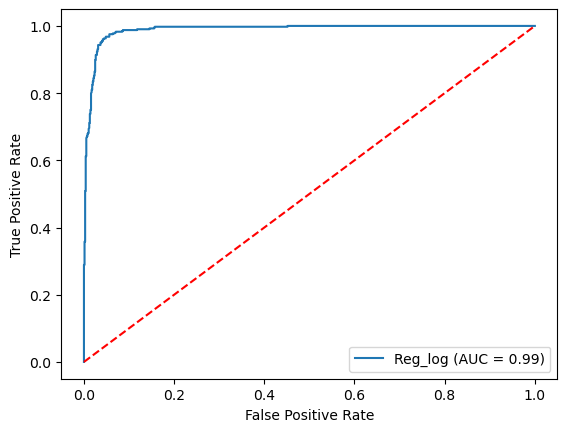


Accuracy Score: 0.9564


In [1029]:
print('LOGISTICAL REGRESSION')
matriz_confusion_logit = confusion_matrix(y_test, y_pred)
print('\nConfusion Matrix:')
print(matriz_confusion_logit)

auc_logit = roc_auc_score(y_test, y_test_pred_score)
print('\nAUC: %.4f' % auc_logit)

fpr_logit, tpr_logit, thresholds_logit = roc_curve(y_test, y_test_pred_score)
display = RocCurveDisplay(fpr=fpr_logit, tpr=tpr_logit, roc_auc=auc_logit, estimator_name='Reg_log')
display.plot()  
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.show() 

accuracy_logit = accuracy_score(y_test, y_pred)

print('\nAccuracy Score: %.4f' %accuracy_logit)

### Método de análisis de discriminante lineal

In [1030]:
lda = LinearDiscriminantAnalysis(n_components=1)
lda = lda.fit(X_train, y_train)

y_test_pred_lda = lda.predict(X_test)

C:\Users\julia\anaconda3\Lib\site-packages\sklearn\utils\validation.py:1184: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


ANÁLISIS DE DISCRIMINANTE LINEAL

Confusion Matrix:
[[702  62]
 [ 12 393]]

AUC: 0.9446


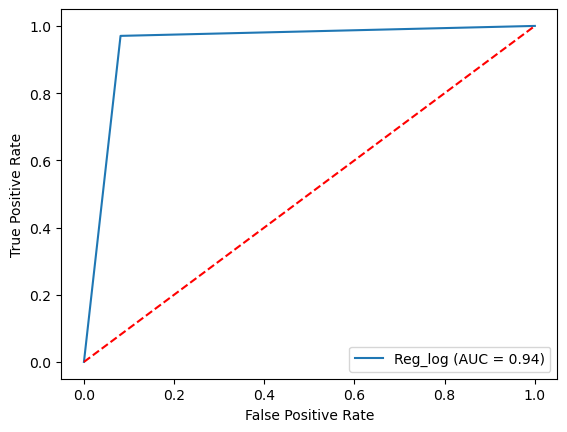


Accuracy Score: 0.9367


In [1031]:
print('ANÁLISIS DE DISCRIMINANTE LINEAL')
matriz_confusion_lda = confusion_matrix(y_test, y_test_pred_lda)
print('\nConfusion Matrix:')
print(matriz_confusion_lda)

auc_lda = roc_auc_score(y_test, y_test_pred_lda)
print('\nAUC: %.4f' % auc_lda)

fpr_lda, tpr_lda, thresholds_lda = roc_curve(y_test, y_test_pred_lda)
display = RocCurveDisplay(fpr=fpr_lda, tpr=tpr_lda, roc_auc=auc_lda, estimator_name='Reg_log')
display.plot()  
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.show() 

accuracy_lda = accuracy_score(y_test, y_test_pred_lda)

print('\nAccuracy Score: %.4f' %accuracy_lda)

### Método de vecinos cercanos (KNN) 

In [1032]:
from sklearn.neighbors import KNeighborsClassifier
k_range = range(1,50)
scores = {}
scores_list = []
for k in k_range:
        knn = KNeighborsClassifier(n_neighbors=k)
        knn.fit(X_train, y_train)
        y_pred_knn = knn.predict(X_test)
        scores[k] = accuracy_score(y_test, y_pred_knn)
        scores_list.append(accuracy_score(y_test, y_pred_knn))

C:\Users\julia\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:228: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\julia\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:228: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\julia\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:228: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\julia\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:228: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_sam

C:\Users\julia\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:228: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\julia\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:228: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\julia\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:228: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\julia\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:228: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_sam

In [1001]:
print('K que maximiza el accuracy:', list(scores.keys())[list(scores.values()).index(max(scores.values()))])

K que maximiza el accuracy: 5


Text(0, 0.5, 'Testing Accuracy')

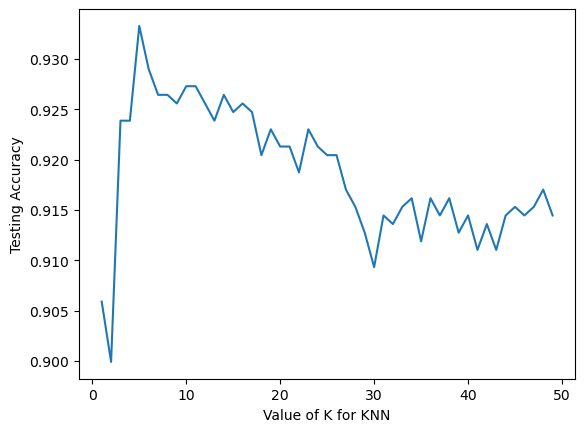

In [1002]:
plt.plot(k_range, scores_list)
plt.xlabel('Value of K for KNN')
plt.ylabel('Testing Accuracy')

In [1005]:
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)
y_test_pred_knn = knn.predict(X_test)

C:\Users\julia\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:228: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


VECINOS CERCANOS (KNN)

Confusion Matrix:
[[723  41]
 [ 37 368]]

AUC: 0.9275


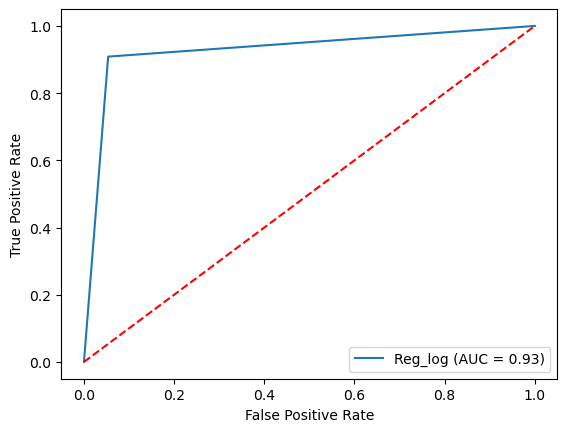


Accuracy Score: 0.9333


In [1033]:
print('VECINOS CERCANOS (KNN)')
matriz_confusion_knn = confusion_matrix(y_test, y_test_pred_knn)
print('\nConfusion Matrix:')
print(matriz_confusion_knn)

auc_knn = roc_auc_score(y_test, y_test_pred_knn)
print('\nAUC: %.4f' % auc_knn)

fpr_knn, tpr_knn, thresholds_knn = roc_curve(y_test, y_test_pred_knn)
display = RocCurveDisplay(fpr=fpr_knn, tpr=tpr_knn, roc_auc=auc_knn, estimator_name='Reg_log')
display.plot()  
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.show() 

accuracy_knn = accuracy_score(y_test, y_test_pred_knn)

print('\nAccuracy Score: %.4f' %accuracy_knn)

4. ¿Cuál de los tres métodos predice mejor? Justifiquen detalladamente utilizando las medidas de precisión que conocen.

Para los 3 métodos utilizamos dos medidas de precisión distintas: el área bajo la curva ROC (AUC) y el accuracy del modelo.

La curva ROC grafica la relación entre la tasa de verdaderos positivos (eje y) y la tasa de falsos positivos (eje x). Consecuentemente, cuanto más se acerque la curva al punto (0,1), mayor será la probabilidad de que el método clasifique correctamente los valores positivos y menor la probabilidad de que los clasifique de forma incorrecta. La medida AUC permite contabilizar estas probabilidades y establece un índice de 0 a 1, en la que los mejores clasificadores tenderán a acercarse a 1.

Por su parte, la medida de accuracy o exactitud suma todos los verdaderos positivos y verdaderos negativos, y los divide por el total de positivos y negativos. Accuracy mide la fracción de predicciones que el modelo realizó correctamente. Al igual que AUC, es un índice de 0 a 1, en la que los métodos con más exactitud obtienen una calificación más cercana a 1.

Analizando los resultaods, observamos que la regresión logit puntúa mejor que los otros dos métodos en ambas medidas de precisión. En otras palabras, este método tiene una mayor probabilidad de acierto de la predicción de la pobreza (AUC) y tiene una mayor fracción de predicciones correctas (accuracy). En segundo lugar viene el modelo de análisis de discriminante lineal, cuyos AUC y accuracy son menores que los del método logit pero mayores que los del modelo de vecinos cercanos (KNN).

5. Con el método que seleccionaron, predigan qué personas son pobres dentro de la base norespondieron. ¿Qué proporción de las personas que no respondieron pudieron identificar como pobres?

En el siguiente cuadro de código indicamos qué cantidad y proporción de las personas que no respondieron fueron identificadas como pobres tanto en la base respondieron como en la norespondieron. La idea detrás de esto es poder comparar entre aquellas personas que sí accedieron a dar el dato de sus ingresos y las que no. Tal como observamos, si bien pueden existir errores de predicción (aunque nuestro modelo prediga 35.07 % de pobres en la base respondieron y el valor real es 35.88 %), el porcentaje de personas pobres en la base norespondieron es mucho menor. Esto va en línea con la idea de que las personas que ganan más tienden a subreportar, o directamente no reportar, sus ingresos.

In [1034]:
X_np = norespondieron[variables_to_keep]
X_np = sm.add_constant(X_np)

y_pred_score_np = result.predict(X_np)

y_pred_np = np.where(y_pred_score_np > 0.5, 1, y_pred_score_np)
y_pred_np = np.where(y_pred_score_np <= 0.5, 0, y_pred_np)

print('Total de personas identificadas como pobres de la base norespondieron: %.0f' %np.sum(y_pred_np))
print('Total de personas identificadas como pobres de la base respondieron: %.0f' %np.sum(y_pred))

print('Porcentaje de personas identificadas como pobres de la base norespondieron: %.2f' %(np.mean(y_pred_np)*100) + ' %')
print('Porcentaje de personas identificadas como pobres de la base respondieron: %.2f' %(np.mean(y_pred)*100) + ' %')

Total de personas identificadas como pobres de la base norespondieron: 24
Total de personas identificadas como pobres de la base respondieron: 410
Porcentaje de personas identificadas como pobres de la base norespondieron: 1.59 %
Porcentaje de personas identificadas como pobres de la base norespondieron: 35.07 %


6. Noten que para correr los tres métodos se utilizaron todas las variables disponibles como predictores. ¿Les parece esto correcto? ¿Qué variables habrían conservado? Con las variables seleccionadas, implementen únicamente el modelo logit nuevamente y comparen las medidas de precisión obtenidas con los resultados del modelo logit anterior. ¿Cambió mucho la precisión? 

Con respecto a si nos parece correcto, creemos que lo mejor es siempre poder disponer de todas las variables que se puedan a la hora realizar las predicciones y luego ir definiendo cuáles son las mejores para utilizar. Por lo tanto, para responder esta pregunta es importante siempre analizar la situación y el contexto de lo que estamos prediciendo.

Naturalmente, si realizamos un análisis como el de este trabajo, es porque no contamos con los datos de los ingresos. Si tuviéramos esos datos, incorporarlos a la calibración del modelo puede ser útil según el contexto. Si contamos con los datos de la canasta que nos permiten crear la línea de pobreza, como sucede en la EPH, no sería necesario ningún modelo, ya que con observar los ingresos y tener la CBT podemos determinar quién es pobre y quién no. Sin embargo, si los datos de la canasta faltaran, por ejemplo, utilizar los datos de ingresos puede ser muy útil para identificar a las personas en situación de pobreza.

Contando con la disponibilidad de variables de salarios, decidimos incluir solo dos: el monto del ingreso total familiar (ITF) y el monto del ingreso per cápita familiar (IPCF). La idea detrás de esto es que estas dos variables agrupan la información de muchas otras variables de ingreso. Junto a estos datos de las personas también incluimos el mismo vector de variables explicativas que previamente utilizamos.

In [1035]:
respondieron = df[df['ITF'] != 0].copy()
norespondieron = df[df['ITF'] == 0].copy()

respondieron['ingreso_necesario'] = respondieron['ad_equiv_hogar']*57371.05
respondieron['pobre'] = (respondieron['ITF'] < respondieron['ingreso_necesario']).astype(int)

new_variables_to_keep = ['ITF','IPCF','DECCFR','CH09','CH08','CH07','CH06','CH04','PP02I','AGLOMERADO','REGION','CAT_INAC','CAT_OCUP','ESTADO','NIVEL_ED','CH16']
new_X = respondieron[new_variables_to_keep]
new_X = sm.add_constant(new_X)

new_y = respondieron[['pobre']]
new_X_train, new_X_test, new_y_train, new_y_test = train_test_split(new_X, new_y, test_size=0.3, random_state=201)

new_logit_model = sm.Logit(new_y_train.astype(float), new_X_train.astype(float))

new_result = new_logit_model.fit()

print(result.summary())

new_y_test_pred_score = new_result.predict(new_X_test)

new_y_pred = np.where(new_y_test_pred_score > 0.5, 1, new_y_test_pred_score)
new_y_pred = np.where(new_y_test_pred_score <= 0.5, 0, new_y_pred)

Optimization terminated successfully.
         Current function value: 0.133689
         Iterations 13
                           Logit Regression Results                           
Dep. Variable:                  pobre   No. Observations:                 2727
Model:                          Logit   Df Residuals:                     2713
Method:                           MLE   Df Model:                           13
Date:                Wed, 25 Oct 2023   Pseudo R-squ.:                  0.7847
Time:                        21:43:09   Log-Likelihood:                -385.09
converged:                       True   LL-Null:                       -1788.3
Covariance Type:            nonrobust   LLR p-value:                     0.000
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
DECCFR        -2.5721      0.134    -19.175      0.000      -2.835      -2.309
CH09          -0.3003      0

NEW LOGISTICAL REGRESSION

Confusion Matrix:
[[741  23]
 [ 21 384]]

AUC: 0.9887


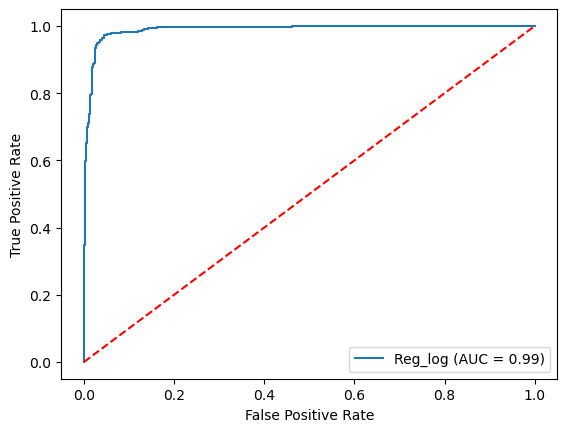


Accuracy Score: 0.9624


In [1036]:
print('NEW LOGISTICAL REGRESSION')
new_matriz_confusion_logit = confusion_matrix(new_y_test, new_y_pred)
print('\nConfusion Matrix:')
print(new_matriz_confusion_logit)

new_auc_logit = roc_auc_score(new_y_test, new_y_test_pred_score)
print('\nAUC: %.4f' % auc_logit)

new_fpr_logit, new_tpr_logit, new_thresholds_logit = roc_curve(new_y_test, new_y_test_pred_score)
new_display = RocCurveDisplay(fpr=new_fpr_logit, tpr=new_tpr_logit, roc_auc=new_auc_logit, estimator_name='Reg_log')
new_display.plot()  
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.show() 

new_accuracy_logit = accuracy_score(new_y_test, new_y_pred)

print('\nAccuracy Score: %.4f' %new_accuracy_logit)

La nueva regresión logística arroja un AUC y Accuracy Score mayor a los de los tres modelos previamente calibrados. Por lo tanto, es posible afirmar que contar con los datos de los ingresos familiares totales y los ingresos per cápita podemos disponer de un modelo más preciso.